# ASSIGNMENT 7
  -------------------------

# QUESTION-2

# > HIERARCHICAL CLUSTERING <

In [1]:
# IMPORT BASIC LIBRARIES
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [40]:
# READING THE DATASET
data=pd.read_excel("EastWestAirlines.xlsx",sheet_name="data")
Data=data.drop(["ID#"],axis=1)

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   ID#                3999 non-null   int64
 1   Balance            3999 non-null   int64
 2   Qual_miles         3999 non-null   int64
 3   cc1_miles          3999 non-null   int64
 4   cc2_miles          3999 non-null   int64
 5   cc3_miles          3999 non-null   int64
 6   Bonus_miles        3999 non-null   int64
 7   Bonus_trans        3999 non-null   int64
 8   Flight_miles_12mo  3999 non-null   int64
 9   Flight_trans_12    3999 non-null   int64
 10  Days_since_enroll  3999 non-null   int64
 11  Award?             3999 non-null   int64
dtypes: int64(12)
memory usage: 375.0 KB


In [4]:
data.isnull().sum()

ID#                  0
Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award?               0
dtype: int64

In [5]:
# STANDARDIZING THE REQUIRED DATA--(Z-SCORE OF DATA)
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
airline_data=pd.DataFrame(scaler.fit_transform(data.iloc[:,1:]))
airline_data

,0,1,2,3,4,5,6,7,8,9,10
0,-0.451141,-0.186299,-0.769578,-0.098242,-0.062767,-0.702786,-1.104065,-0.328603,-0.362168,1.395454,-0.766919
1,-0.539457,-0.186299,-0.769578,-0.098242,-0.062767,-0.701088,-0.999926,-0.328603,-0.362168,1.379957,-0.766919
2,-0.320031,-0.186299,-0.769578,-0.098242,-0.062767,-0.539253,-0.791649,-0.328603,-0.362168,1.411920,-0.766919
3,-0.583799,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,-0.328603,-0.362168,1.372208,-0.766919
4,0.239678,-0.186299,1.409471,-0.098242,-0.062767,1.083121,1.499394,1.154932,0.692490,1.363975,1.303918
...,...,...,...,...,...,...,...,...,...,...,...
3994,-0.547079,-0.186299,-0.769578,-0.098242,-0.062767,-0.356960,-0.791649,-0.185750,-0.098503,-1.315120,1.303918
3995,-0.091465,-0.186299,-0.769578,-0.098242,-0.062767,-0.669367,-0.687511,-0.328603,-0.362168,-1.318994,1.303918
3996,-0.000043,-0.186299,0.683121,-0.098242,-0.062767,0.343804,-0.375096,-0.328603,-0.362168,-1.315604,1.303918
3997,-0.185607,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,0.028531,-0.098503,-1.316088,-0.766919


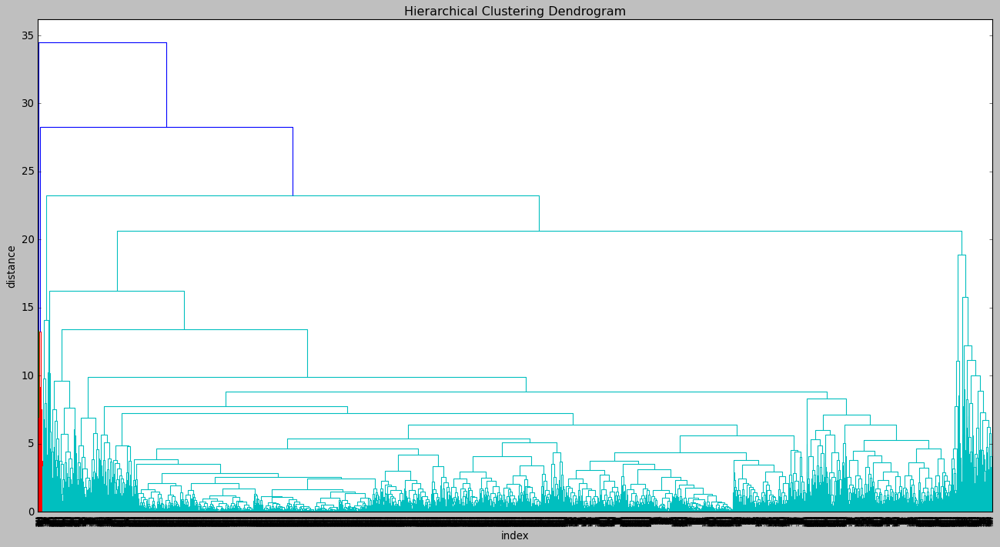

In [33]:
import scipy.cluster.hierarchy as sch
from scipy.cluster.hierarchy import linkage
link=linkage(airline_data,method='complete',metric='euclidean')
plt.figure(figsize=(20,10))
plt.xlabel("index")
plt.ylabel("distance")
plt.title("Hierarchical Clustering Dendrogram")
sch.dendrogram(link)
plt.show()

In [41]:
from sklearn.cluster import AgglomerativeClustering 
import warnings 
warnings.filterwarnings('ignore')
h_complete = AgglomerativeClustering(n_clusters=5,linkage='average',affinity = "euclidean").fit(airline_data) 

cluster_labels=pd.Series(h_complete.labels_)
cluster_labels
Data['clust']=cluster_labels # creating a  new column and assigning it to new column 
Data

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,0
5,16420,0,1,1,1,0,0,0,0,6942,0,0
6,84914,0,3,1,1,27482,25,0,0,6994,0,0
7,20856,0,1,1,1,5250,4,250,1,6938,1,0
8,443003,0,3,2,1,1753,43,3850,12,6948,1,0
9,104860,0,3,1,1,28426,28,1150,3,6931,1,0


NOTE: AS THE NUMBERS OF OBSERVATIONS ARE MORE WE CAN'T MAKE CLUSTERING USING HIERARCHY, SO WE CONTINUE WITH K-MEANS

In [43]:
Data.iloc[:,1:].groupby(Data.clust).mean()

,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
clust,,,,,,,,,,,
0,144.193013,2.054034,1.014577,1.000754,16806.654184,11.476753,439.180699,1.319176,4117.825333,0.368937,0.0
1,78.800000,3.466667,1.000000,4.066667,93927.866667,28.066667,506.666667,1.600000,4613.866667,0.533333,1.0
2,0.000000,1.000000,1.000000,1.000000,17108.000000,32.000000,4823.000000,23.000000,7283.000000,1.000000,2.0
3,296.000000,3.000000,1.000000,1.000000,63527.666667,63.666667,16341.000000,48.000000,2476.000000,1.000000,3.0
4,500.000000,1.000000,1.000000,1.000000,71954.000000,86.000000,30817.000000,53.000000,1373.000000,1.000000,4.0


By the above information we can understand that the passengers of Eastwest airlines who are belong to cluster 0 have an 
avg of 95974.26 miles eligible for award travel and eligible for award

In [52]:
clust_0=Data[Data.clust==0]
clust_0

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
0,28143,0,1,1,1,174,1,0,0,7000,0,0
1,19244,0,1,1,1,215,2,0,0,6968,0,0
2,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,14776,0,1,1,1,500,1,0,0,6952,0,0
4,97752,0,4,1,1,43300,26,2077,4,6935,1,0
5,16420,0,1,1,1,0,0,0,0,6942,0,0
6,84914,0,3,1,1,27482,25,0,0,6994,0,0
7,20856,0,1,1,1,5250,4,250,1,6938,1,0
8,443003,0,3,2,1,1753,43,3850,12,6948,1,0
9,104860,0,3,1,1,28426,28,1150,3,6931,1,0


In [53]:
clust_1=Data[Data.clust==1]
clust_1

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
106,96627,1182,1,1,3,49059,26,2300,9,6738,1,1
384,28193,0,5,1,4,103456,32,0,0,6980,1,1
850,25629,0,4,1,5,107308,36,600,2,5966,1,1
904,15835,0,2,1,5,112171,16,0,0,5825,1,1
1036,154664,0,4,1,3,73881,33,0,0,5769,0,1
1244,166465,0,4,1,4,98717,30,0,0,5531,0,1
1300,737514,0,3,1,4,43993,40,2150,7,5030,0,1
1878,128302,0,5,1,4,132263,32,400,2,4103,1,1
1917,82981,0,5,1,3,105325,44,1000,2,3964,1,1
1946,126873,0,4,1,5,95598,32,500,1,3880,1,1


In [54]:
clust_2=Data[Data.clust==2]
clust_2

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
275,1704838,0,1,1,1,17108,32,4823,23,7283,1,2


In [55]:
clust_3=Data[Data.clust==3]
clust_3

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
2015,53232,888,4,1,1,80696,65,22100,45,3831,1,3
3235,287033,0,1,1,1,26161,58,12873,53,2272,1,3
3594,27619,0,4,1,1,83726,68,14050,46,1325,1,3


In [56]:
clust_4=Data[Data.clust==4]
clust_4

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
3583,160114,500,1,1,1,71954,86,30817,53,1373,1,4


AS THE OBSERVATIONS IN THE DATASET ARE MORE WE CANT FIND THE PERFECT DENGROGRAM.SO WE CONTINE WITH REMAINING CLUSTERING 
MODEL TO GET THE EXACT CLUSTERINGS(HOMOGENEOUS OBSERVATIONS)

# >KMEANS CLUSTERING<

In [7]:
# STANDARDIZED DATA
airline_data

,0,1,2,3,4,5,6,7,8,9,10
0,-0.451141,-0.186299,-0.769578,-0.098242,-0.062767,-0.702786,-1.104065,-0.328603,-0.362168,1.395454,-0.766919
1,-0.539457,-0.186299,-0.769578,-0.098242,-0.062767,-0.701088,-0.999926,-0.328603,-0.362168,1.379957,-0.766919
2,-0.320031,-0.186299,-0.769578,-0.098242,-0.062767,-0.539253,-0.791649,-0.328603,-0.362168,1.411920,-0.766919
3,-0.583799,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,-0.328603,-0.362168,1.372208,-0.766919
4,0.239678,-0.186299,1.409471,-0.098242,-0.062767,1.083121,1.499394,1.154932,0.692490,1.363975,1.303918
...,...,...,...,...,...,...,...,...,...,...,...
3994,-0.547079,-0.186299,-0.769578,-0.098242,-0.062767,-0.356960,-0.791649,-0.185750,-0.098503,-1.315120,1.303918
3995,-0.091465,-0.186299,-0.769578,-0.098242,-0.062767,-0.669367,-0.687511,-0.328603,-0.362168,-1.318994,1.303918
3996,-0.000043,-0.186299,0.683121,-0.098242,-0.062767,0.343804,-0.375096,-0.328603,-0.362168,-1.315604,1.303918
3997,-0.185607,-0.186299,-0.769578,-0.098242,-0.062767,-0.689286,-1.104065,0.028531,-0.098503,-1.316088,-0.766919


Text(0.5, 1.0, 'elbow curve')

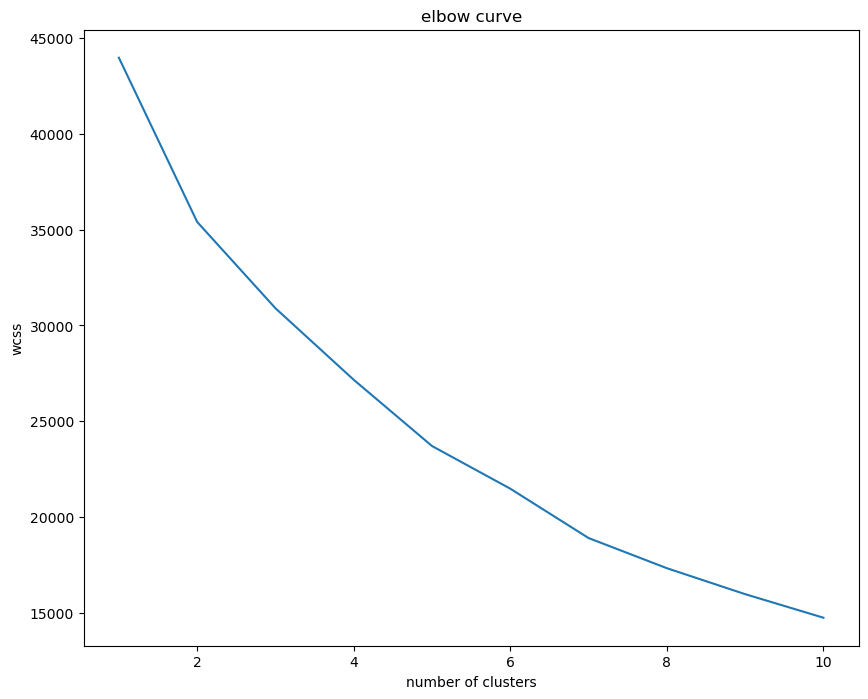

In [8]:
# PLOTTING ELBOW CURVE TO DECIDE BEST K-VALUE
from sklearn.cluster import KMeans
fig=plt.figure(figsize=(10,8))
wcss=[]
for i in range(1,11):
    kmeans=KMeans(n_clusters=i)
    kmeans.fit(airline_data)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.xlabel("number of clusters")
plt.ylabel("wcss")
plt.title("elbow curve")

# MODEL BUILDING

In [9]:
model=KMeans(n_clusters=6)
model.fit(airline_data)
model.labels_

array([0, 0, 0, ..., 1, 0, 0])

In [10]:
# APPENDING K VALUES TO THE DATASET AS "CLUST COLUMN"
k=pd.DataFrame(model.labels_)
data["clust"]=k
data

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
0,1,28143,0,1,1,1,174,1,0,0,7000,0,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0,0


In [11]:
# GROUPING ALL THE OBSERVATIONS WITH CLUSTER AVERAGE
data.iloc[:,1:].groupby(data.clust).mean()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clust
clust,,,,,,,,,,,,
0,43392.314354,31.892344,1.307656,1.016268,1.000478,4864.870813,7.249282,156.037799,0.470335,3635.357895,0.000000,0.0
1,57330.252451,95.974265,1.677696,1.019608,1.000000,10575.537990,10.688725,422.435049,1.292892,4234.785539,1.000000,1.0
2,137579.446809,56.863382,4.106383,1.002240,1.002240,47785.155655,19.688690,372.816349,1.136618,5064.029115,0.585666,2.0
3,115243.642857,5590.535714,2.053571,1.000000,1.000000,19452.428571,12.339286,947.625000,2.857143,3893.660714,0.517857,3.0
4,197498.255814,514.054264,2.325581,1.046512,1.000000,35617.232558,29.682171,6010.426357,17.488372,4707.015504,0.813953,4.0
5,138061.400000,78.800000,3.466667,1.000000,4.066667,93927.866667,28.066667,506.666667,1.600000,4613.866667,0.533333,5.0


PASSENGERS ARE DIVIDED INTO CLUSTERS BASED ON THEIR SIMILAR CHARACTERSTICS.PASSENGERS IN CLUSTER"3" HAS MOST AWARD
WINNING CHANCES AS THEY HAVE TRAVEL MAXIMUN NUMBER OF MILES.

# -----------------------------------------------------------------------------------------------------------

# >DB SCAN<

In [12]:
# IMPORT BASIC AND REQUIRED LIBRARIES
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [13]:
# READ THE DATASET
Air=pd.read_excel('EastWestAirlines.xlsx',sheet_name='data')
Air

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [14]:
# DROPPING (ID#) COLUMN AS IT IS NOT REQUIRED VARIABLE
air_data=Air.drop(["ID#"],axis=1)

In [15]:
air_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   Balance            3999 non-null   int64
 1   Qual_miles         3999 non-null   int64
 2   cc1_miles          3999 non-null   int64
 3   cc2_miles          3999 non-null   int64
 4   cc3_miles          3999 non-null   int64
 5   Bonus_miles        3999 non-null   int64
 6   Bonus_trans        3999 non-null   int64
 7   Flight_miles_12mo  3999 non-null   int64
 8   Flight_trans_12    3999 non-null   int64
 9   Days_since_enroll  3999 non-null   int64
 10  Award?             3999 non-null   int64
dtypes: int64(11)
memory usage: 343.8 KB


In [16]:
# STANDARDIZING THE DATA
standardization=StandardScaler()
X=standardization.fit_transform(air_data)
X

array([[-4.51140783e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01,  1.39545434e+00, -7.66919299e-01],
       [-5.39456874e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01,  1.37995704e+00, -7.66919299e-01],
       [-3.20031232e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01,  1.41192021e+00, -7.66919299e-01],
       ...,
       [-4.29480975e-05, -1.86298687e-01,  6.83121167e-01, ...,
        -3.62167870e-01, -1.31560393e+00,  1.30391816e+00],
       [-1.85606976e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -9.85033311e-02, -1.31608822e+00, -7.66919299e-01],
       [-7.00507951e-01, -1.86298687e-01, -7.69578406e-01, ...,
        -3.62167870e-01, -1.31754109e+00, -7.66919299e-01]])

In [17]:
# THIS GIVES THE APPROX EPS VALUE
from sklearn.neighbors import NearestNeighbors
neigh=NearestNeighbors(n_neighbors=20)
nbrs=neigh.fit(X)
distances,indices=nbrs.kneighbors(X)

Text(0.5, 1.0, 'K DISTANCE GRAPH')

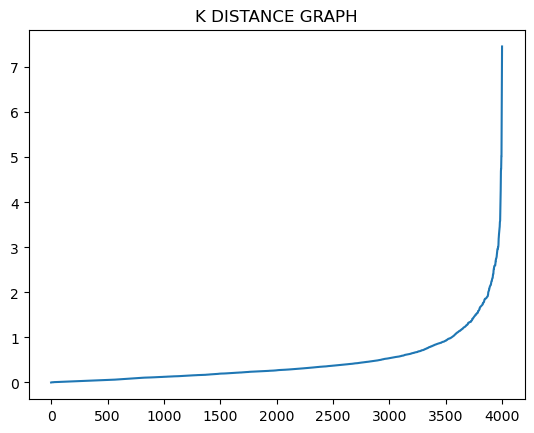

In [18]:
distances = np.sort(distances,axis=0)
distances = distances[:,1]
plt.plot(distances) 
plt.title("K DISTANCE GRAPH")

In [19]:
# MODEL-1 ---- MAKING MODEL TO FIND THE CLUSTERS(LABELS)
dbscan = DBSCAN(eps=2, min_samples=12)
dbscan.fit(X)
dbscan.labels_

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [20]:
c=pd.DataFrame(dbscan.labels_,columns=["cluster"])
pd.set_option("display.max_rows",None)
c # CLUSTERS OF ALL THE OBSERVATIONS.   HERE CLUSTER= -1 INDICATE OUTILER(NOISE)

,cluster
0,0
1,0
2,0
3,0
4,1
5,0
6,0
7,1
8,-1
9,1


In [21]:
# APPENDING CLUSTERS COLUMN TO ORIGINAL DATASET
airdata=pd.concat([Air,c],axis=1)
airdata

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cluster
0,1,28143,0,1,1,1,174,1,0,0,7000,0,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1,1
5,6,16420,0,1,1,1,0,0,0,0,6942,0,0
6,7,84914,0,3,1,1,27482,25,0,0,6994,0,0
7,8,20856,0,1,1,1,5250,4,250,1,6938,1,1
8,9,443003,0,3,2,1,1753,43,3850,12,6948,1,-1
9,10,104860,0,3,1,1,28426,28,1150,3,6931,1,1


Text(0.5, 1.0, 'CLUSTERS USING DBSCAN')

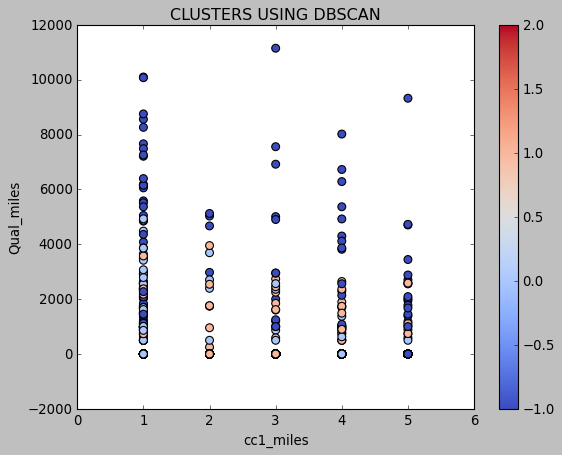

In [22]:
# THIS GRAPH SHOWS THAT HOW ACCURATE THE 2 VARIBLES FROM THE DATA ARE HOMOGENEOUS.
plt.style.use("classic")
airdata.plot(x="cc1_miles",y="Qual_miles",c=dbscan.labels_,kind="scatter",s=50,cmap=plt.cm.coolwarm)
plt.title("CLUSTERS USING DBSCAN")

Text(0.5, 1.0, 'CLUSTERS USING DBSCAN')

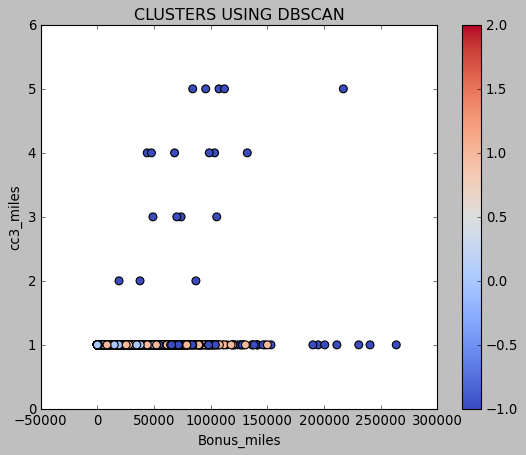

In [23]:
plt.style.use("classic")
airdata.plot(x="Bonus_miles",y="cc3_miles",c=dbscan.labels_,kind="scatter",s=50,cmap=plt.cm.coolwarm)
plt.title("CLUSTERS USING DBSCAN")

In [24]:
# SILHOUTTE SCORE GIVES HOW ACCURATE THE MODEL IS GROUPING HOMOGENEOUS OBSERVATIONS
import sklearn
sklearn.metrics.silhouette_score(X,c)

0.255303940580989

AS THE SILHOUTTE SCORE IS VERY LESS(0.255303940580989) WE NEED TO IMPROVE BY CHANGING THE EPS AND MIN_SAMPLES VALUES

In [25]:
# MODEL-2
dbscan1=DBSCAN(eps=3,min_samples=13)
dbscan1.fit(X)
dbscan1.labels_

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [26]:
c1=pd.DataFrame(dbscan1.labels_,columns=["cluster1"])
c1

,cluster1
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,-1
9,0


In [27]:
airdata1=pd.concat([airdata,c1],axis=1)
airdata1

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cluster,cluster1
0,1,28143,0,1,1,1,174,1,0,0,7000,0,0,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0,0,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0,0,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0,0,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1,1,0
5,6,16420,0,1,1,1,0,0,0,0,6942,0,0,0
6,7,84914,0,3,1,1,27482,25,0,0,6994,0,0,0
7,8,20856,0,1,1,1,5250,4,250,1,6938,1,1,0
8,9,443003,0,3,2,1,1753,43,3850,12,6948,1,-1,-1
9,10,104860,0,3,1,1,28426,28,1150,3,6931,1,1,0


Text(0.5, 1.0, 'CLUSTERS USING DBSCAN')

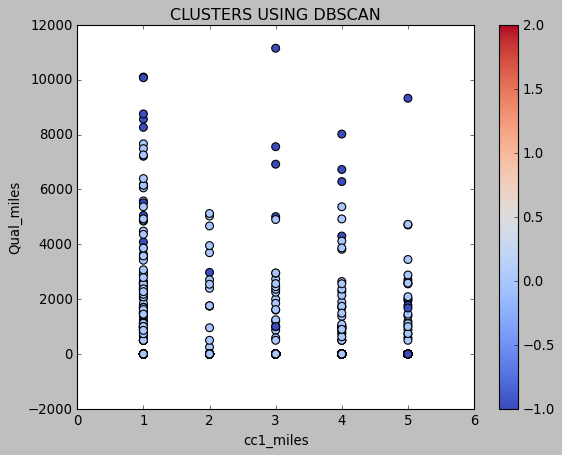

In [28]:
plt.style.use("classic")
airdata1.plot(x="cc1_miles",y="Qual_miles",c=dbscan1.labels_,kind="scatter",s=50,cmap=plt.cm.coolwarm)
plt.title("CLUSTERS USING DBSCAN")

Text(0.5, 1.0, 'CLUSTERS USING DBSCAN')

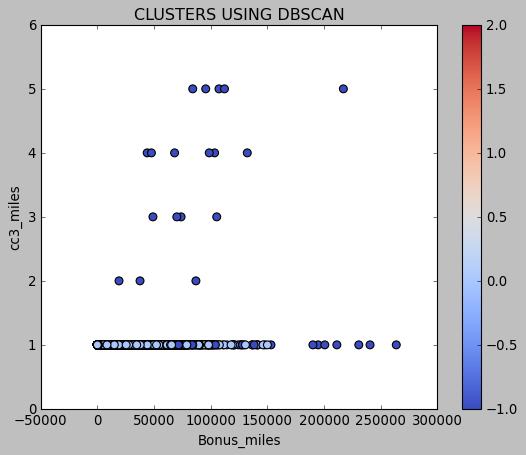

In [29]:
plt.style.use("classic")
airdata1.plot(x="Bonus_miles",y="cc3_miles",c=dbscan1.labels_,kind="scatter",s=50,cmap=plt.cm.coolwarm)
plt.title("CLUSTERS USING DBSCAN")

In [30]:
import sklearn
sklearn.metrics.silhouette_score(X,c) # C-LABELS FOR MODEL-1

0.255303940580989

In [31]:
import sklearn
sklearn.metrics.silhouette_score(X,c1) # C-LABELS FOR MODEL-2

0.5445912609076593

AS THE SILHOUETTE SCORE IS 0.5445912609076593 IS GREATER THAN PREVIOUS MODEL. SO THAT WE CAN SAY THAT WE IMPROVED OUR MODEL.
OUR ULTIMATE AIM IS TO FIND MIN_SAMPLES ANS EPS VALUES TO MAKE THE  BEST MODEL THAT PREDICTS THE HOMOGENEOUS OBSERVATIONS
AND MAKE THEM CLUSTERS.

# ---------------------------------------------------------------------------------------------------------------